In [43]:
import torch
import plotly.offline as py
import plotly.graph_objs as go
import pandas as pd
import numpy as np
py.init_notebook_mode(connected=True)

In [44]:
data_origin = pd.read_csv('data_to_learn.tradition.csv')

In [45]:
#drop data where nGB = 28 & 8
data_origin = data_origin[data_origin.nGB != 28]
#data_origin = data_origin[data_origin.nGB != 8]

In [46]:
#random shuffle
data0 = data_origin.sample(frac=1, random_state=1)
#split data
Y_all = data0['BindingEnergy'].to_numpy()
Y_train = Y_all[0:int(len(data0)*.7)]
Y_temp = Y_all[int(len(data0)*.7):]
Y_cos = Y_temp[:int(len(Y_temp)*.5)]
Y_test = Y_temp[int(len(Y_temp)*.5):]

X_all = data0.iloc[:, 4:].to_numpy()
X_train = X_all[:int(len(X_all)*.7)]

#normalization
X_mean = np.mean(X_train, axis = 0)
X_std = np.std(X_train, axis = 0)

X_train = (X_train - X_mean) / X_std

X_temp = X_all[int(len(X_all)*.7):]
X_temp = (X_temp - X_mean) / X_std
X_cos = X_temp[:int(len(X_temp)*.5)]
X_test = X_temp[int(len(X_temp)*.5):]   

In [5]:
(N, D_in) = X_train.shape
H = 200
D_out = 1

X_train = torch.from_numpy(X_train)
X_train = X_train.float()
y = torch.from_numpy(Y_train)
y = y.float()
y = y.view(y.shape[0],1)
model1 = torch.nn.Sequential(
    torch.nn.Linear(D_in, H),
    torch.nn.ReLU(),
    torch.nn.Linear(H, 50),
    torch.nn.ReLU(),
    torch.nn.Linear(50, 25),
    torch.nn.ReLU(),
    torch.nn.Linear(25, D_out)
)

loss_fn1 = torch.nn.MSELoss(reduction='sum')
learning_rate = 2e-5
optimizer1 = torch.optim.SGD(model1.parameters(), lr = learning_rate, momentum = 0.9, weight_decay = 0.3)#0.2

In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model1.to(device)
X_train = X_train.to(device)
y = y.to(device)

In [7]:
for t in range(100001):
    y_pred = model1(X_train)
    
    loss = loss_fn1(y_pred, y)
    if t%500 == 0:
        print(t, loss.item())
    
    optimizer1.zero_grad()
    
    loss.backward()
    
    optimizer1.step()

0 1999.031982421875
500 22.275123596191406
1000 15.549443244934082
1500 6.1929931640625
2000 4.446841239929199
2500 4.060763835906982
3000 2.9534671306610107
3500 2.477320909500122
4000 1.8960440158843994
4500 1.8720113039016724
5000 8.756678581237793
5500 1.5297445058822632
6000 6.091319561004639
6500 1.249572992324829
7000 1.1696383953094482
7500 1.1179819107055664
8000 1.0688380002975464
8500 1.0795338153839111
9000 1.0180367231369019
9500 1.0313637256622314
10000 0.9679046869277954
10500 2.266659736633301
11000 0.9055899381637573
11500 1.0495086908340454
12000 0.8563982248306274
12500 0.882895827293396
13000 4.084245204925537
13500 1.0174319744110107
14000 0.80600905418396
14500 0.9303566813468933
15000 0.7835915684700012
15500 1.1498894691467285
16000 0.7731291055679321
16500 1.4592666625976562
17000 0.7992051839828491
17500 1.0814932584762573
18000 0.7585610747337341
18500 0.7739923000335693
19000 1.6074903011322021
19500 0.735291063785553
20000 0.7275509238243103
20500 0.8177153

## Training

In [8]:
#training set
Y_mean = np.mean(Y_train)
SS_tot = torch.sum(torch.pow(y - Y_mean, 2))
SS_res = torch.sum(torch.pow(y_pred - y, 2))
y_train_pred = y_pred.detach().cpu().numpy()
R_squared = 1-SS_res/SS_tot
R_squared = 1-(1-R_squared)*(X_train.shape[0]-1)/(X_train.shape[0]-1-X_train.shape[1])

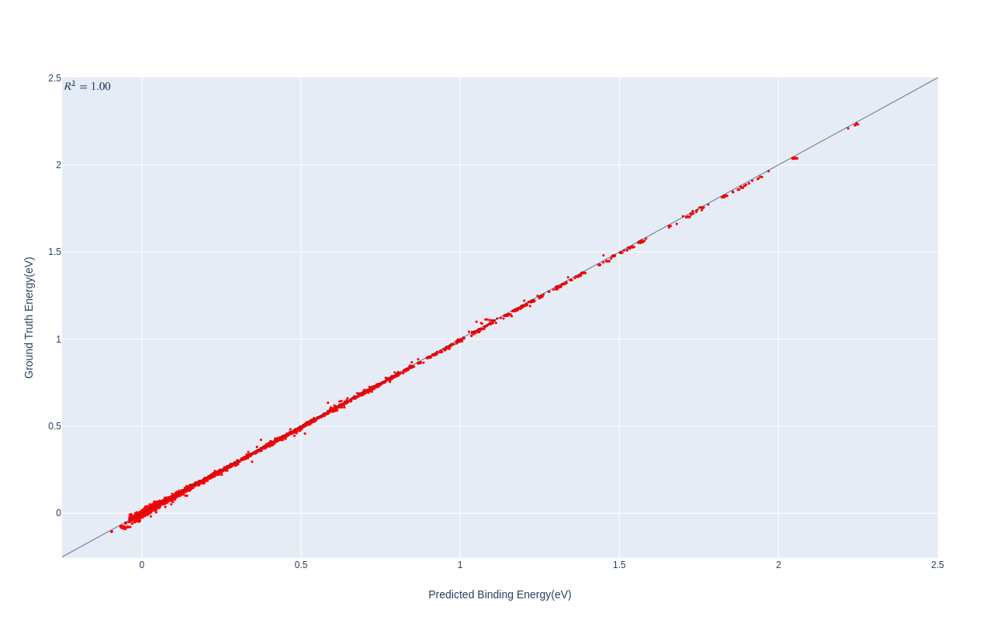

In [9]:
#draw correlation
main = go.Scatter(x = y_train_pred.squeeze(), 
          y = Y_train, 
          marker={'color':'red', 'symbol':'circle','size':3}, 
          mode='markers'
         )

data = [main]

layout = go.Layout(autosize = False, 
           height = 800,
           width = 800, 
           xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False},
           yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False},
           annotations = [
                   dict(
                   x = 0,
                   y = 1,
                   xref = 'paper',
                   yref = 'paper',
                   text = '$R^2= %4.2f$'%(R_squared),
                   showarrow = False,
                   font = dict(size = 12)
                   )
               ],
           shapes =[{'type':'line', 
                            'x0':-0.25,
                            'x1':2.5,
                            'y0':-0.25,
                            'y1':2.5,
                            'line':{'width':0.7}
                    }],
          )
plot = py.iplot(go.Figure(data = data, layout = layout))

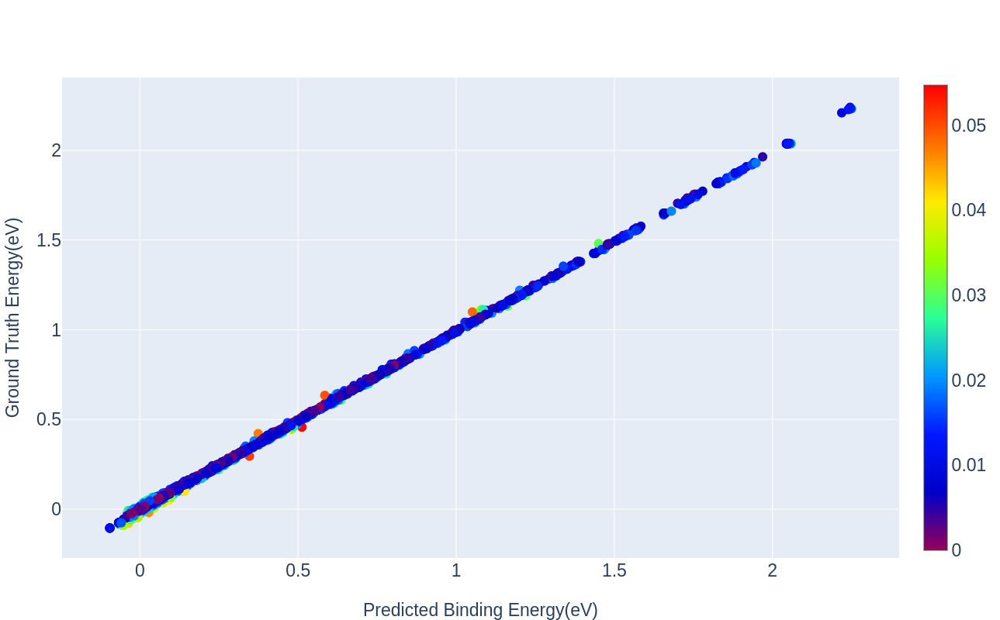

In [10]:
# training set
main = go.Scatter(x = y_train_pred.squeeze(), 
                y = Y_train,
                text = np.around(abs(y_train_pred.squeeze()-Y_train),3).tolist(),
                hoverinfo = 'text',
                marker={'size':12, 'color':abs(y_train_pred.squeeze()-Y_train), 'colorscale':'Rainbow' ,
                'symbol':'circle','showscale':True, 'colorbar':dict(tickfont = dict(size = 23))}, 
                mode='markers'
                )
data = [main]

layout = go.Layout(autosize = False,
            height = 800,
            width = 800,     
            xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            )
fig = go.Figure(data = data, layout = layout)
plot = py.iplot(fig)

## Cross Validation

In [11]:
X_cos = torch.from_numpy(X_cos)
X_cos = X_cos.float()
X_cos = X_cos.to(device)
Y_cos_pred = model1(X_cos)
Y_cos_pred = Y_cos_pred.detach().cpu()
Y_cos_pred = Y_cos_pred.numpy()
Y_cos_pred = Y_cos_pred.squeeze()
Y_cos = Y_cos.squeeze()
Y_mean = np.mean(Y_cos)
SS_tot = np.sum(np.power(Y_cos - Y_mean, 2))
SS_res = np.sum(np.power(Y_cos_pred - Y_cos, 2))
R_squared = 1-SS_res/SS_tot

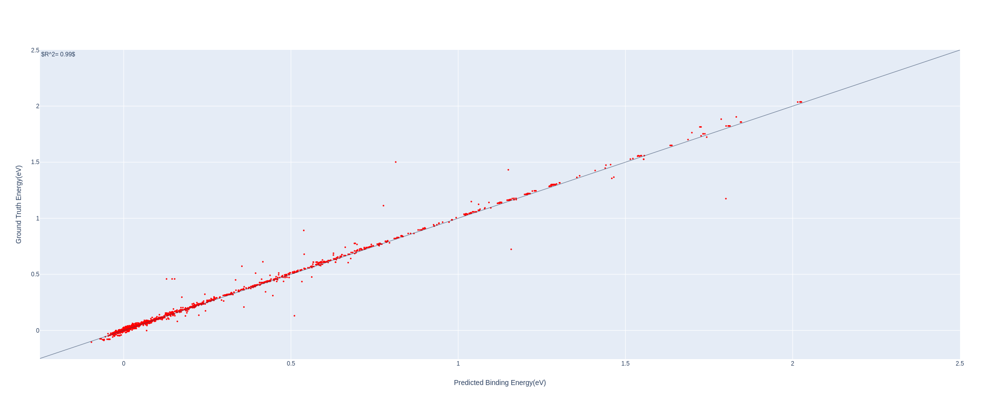

In [13]:
#draw correlation
main = go.Scatter(x = Y_cos_pred, 
          y = Y_cos, 
          marker={'color':'red', 'symbol':'circle','size':3}, 
          mode='markers'
         )

data = [main]

layout = go.Layout(autosize = False, 
           height = 800,
           width = 800, 
           xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False},
           yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False},
           annotations = [
                   dict(
                   x = 0,
                   y = 1,
                   xref = 'paper',
                   yref = 'paper',
                   text = '$R^2= %4.2f$'%(R_squared),
                   showarrow = False,
                   font = dict(size = 12)
                   )
               ],
           shapes =[{'type':'line', 
                            'x0':-0.25,
                            'x1':2.5,
                            'y0':-0.25,
                            'y1':2.5,
                            'line':{'width':0.7}
                    }],
          )
plot = py.iplot(go.Figure(data = data, layout = layout))

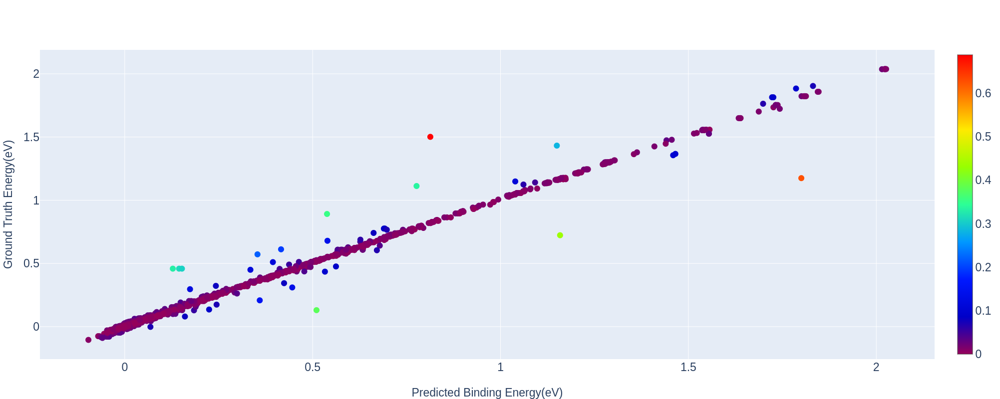

In [12]:
# cross validation set
main = go.Scatter(x = Y_cos_pred, 
                y = Y_cos,
                text = np.around(abs(Y_cos_pred-Y_cos),3).tolist(),
                hoverinfo = 'text',
                marker={'size':12, 'color':abs(Y_cos_pred-Y_cos), 'colorscale':'Rainbow' ,
                'symbol':'circle','showscale':True, 'colorbar':dict(tickfont = dict(size = 23))}, 
                mode='markers'
                )
data = [main]

layout = go.Layout(autosize = False,
            height = 800,
            width = 800,     
            xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            )
fig = go.Figure(data = data, layout = layout)
plot = py.iplot(fig)

## Test

In [14]:
#test set
X_test = torch.from_numpy(X_test)
X_test = X_test.float()
X_test = X_test.to(device)
Y_test_pred = model1(X_test)
Y_test_pred = Y_test_pred.detach().cpu()
Y_test_pred = Y_test_pred.numpy()
Y_test_pred = Y_test_pred.squeeze()
Y_test = Y_test.squeeze()
Y_mean = np.mean(Y_test)
SS_tot = np.sum(np.power(Y_test - Y_mean, 2))
SS_res = np.sum(np.power(Y_test_pred - Y_test, 2))
R_squared = 1-SS_res/SS_tot
R_squared = 1-(1-R_squared)*(X_train.shape[0]-1)/(X_train.shape[0]-1-X_train.shape[1])

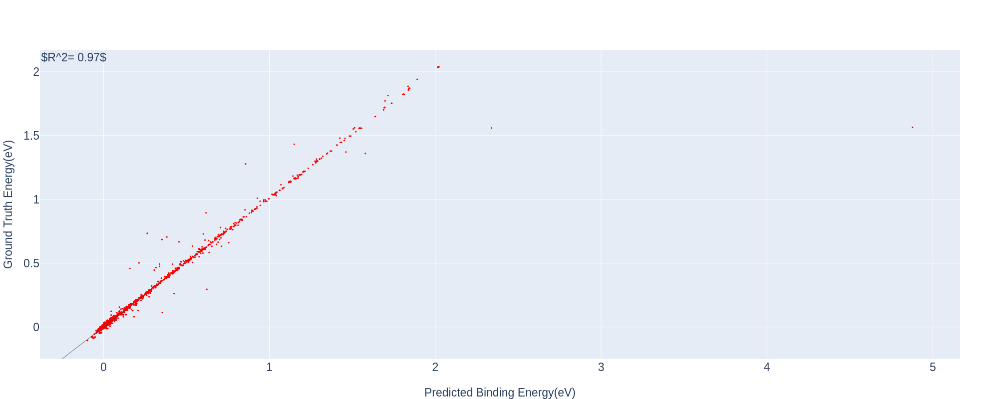

In [15]:
#draw correlation
main = go.Scatter(x = Y_test_pred, 
          y = Y_test, 
          marker={'color':'red', 'symbol':'circle','size':3}, 
          mode='markers'
         )

data = [main]

layout = go.Layout(autosize = False, 
           height = 800,
           width = 800, 
           xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
        yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
           annotations = [
                   dict(
                   x = 0,
                   y = 1,
                   xref = 'paper',
                   yref = 'paper',
                   text = '$R^2= %4.2f$'%(R_squared),
                   showarrow = False,
                   font = dict(size = 23)
                   )
               ],
           shapes =[{'type':'line', 
                            'x0':-0.25,
                            'x1':0.25,
                            'y0':-0.25,
                            'y1':0.25,
                            'line':{'width':0.7}
                    }],
          )
plot = py.iplot(go.Figure(data = data, layout = layout))

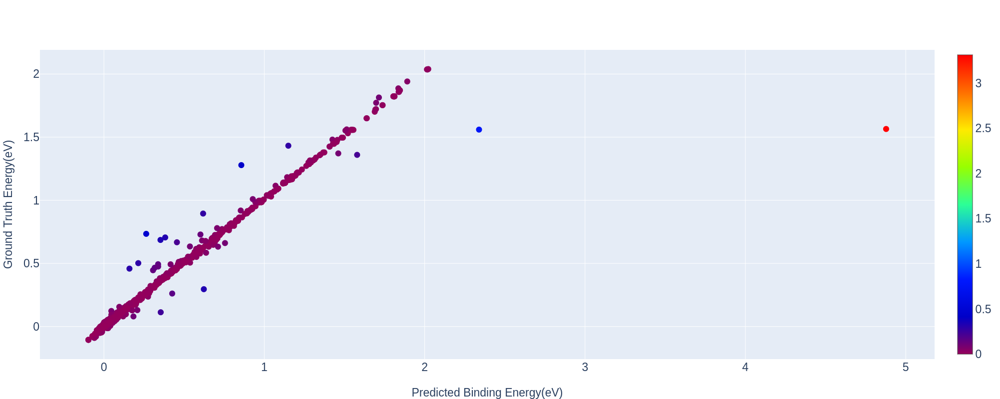

In [16]:
main = go.Scatter(x = Y_test_pred, 
                y = Y_test,
                text = np.around(abs(Y_test_pred-Y_test),3).tolist(),
                hoverinfo = 'text',
                marker={'size':12, 'color':abs(Y_test_pred-Y_test), 'colorscale':'Rainbow' ,
                'symbol':'circle','showscale':True, 'colorbar':dict(tickfont = dict(size = 23))}, 
                mode='markers'
                )
data = [main]

layout = go.Layout(autosize = False,
            height = 800,
            width = 800,     
            xaxis={'title':"Predicted Binding Energy(eV)", 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            yaxis = {'title':'Ground Truth Energy(eV)', 'zeroline':False, 'titlefont':dict(size = 23), 'tickfont':dict(size = 23)},
            )
fig = go.Figure(data = data, layout = layout)
plot = py.iplot(fig)

In [21]:
PATH = 'model_layers.pt'
torch.save(model1.cpu(), PATH)

In [22]:
data_origin

,nGB,nRandom,BindingEnergy,id,pe,pos_1,pos_2,pos_3,cna,centro_fnn,...,f_2,f_3,stress_1,stress_2,stress_3,stress_4,stress_5,stress_6,voronoi_1,voronoi_2
0,1,1,0.001107,57648,-8.90781,1.87391,56.636000,-8.063477,3.0,6.033400e-04,...,-6.170730e-06,4.010470e-07,53757.70,20902.40,-172341.00,-91705.8000,147018.000,-88657.100,15.8657,14.0
1,1,2,0.003313,51853,-8.89995,48.81900,33.777100,19.472519,3.0,2.037043e-06,...,6.832920e-06,-4.615460e-05,11925.80,12800.00,32683.10,1637.5300,-1137.930,11929.800,15.8617,14.0
2,1,3,0.000967,60668,-8.89760,7.67237,46.942100,10.695526,3.0,1.724404e-04,...,3.605700e-05,-9.934411e-06,-24029.70,95367.50,-78300.20,37314.7000,-20587.300,881.814,15.8497,14.0
3,1,4,-0.008195,10034,-8.92250,16.13360,0.015369,-5.868485,3.0,1.050369e-02,...,3.619720e-05,6.110110e-05,296787.00,-204639.00,5749.62,-266990.0000,375494.000,-12452.800,15.9133,14.0
4,1,5,0.005728,21910,-8.90006,20.85490,18.011200,-18.592484,3.0,4.035950e-06,...,1.762520e-05,2.931540e-05,12739.10,9464.20,34735.10,-482.1030,316.154,6355.640,15.8622,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26995,27,996,-0.000262,94831,-8.91707,41.03320,47.003400,6.964752,3.0,1.642930e-03,...,-3.070230e-07,1.101730e-06,212085.00,-126412.00,-81758.40,-1703.2400,-67912.100,-11101.100,15.8928,14.0
26996,27,997,0.000748,87902,-8.89996,2.98416,47.000700,18.043762,3.0,1.564263e-08,...,4.802320e-07,8.567330e-07,7232.31,7529.02,19715.20,-2325.6300,-1119.230,-964.496,15.8593,14.0
26997,27,998,0.002400,34201,-8.90024,41.77930,13.430800,9.073761,3.0,1.824563e-04,...,8.535220e-07,-3.595920e-07,29792.70,13036.20,13421.80,83.0653,-35482.300,-6986.170,15.8622,14.0
26998,27,999,0.144771,62641,-8.92266,24.64200,31.328200,-3.186249,3.0,6.569619e+00,...,1.391750e-06,3.497410e-07,199124.00,234749.00,2978620.00,-122624.0000,586884.000,-10773.000,16.4405,14.0


In [53]:
pos = data0.iloc[:,5:8].to_numpy()
pos_test = pos[int(len(pos)*0.85):]
Ep = np.divide(abs(Y_test_pred-Y_test), abs(Y_test))

In [54]:
main = go.Scatter(x = pos_test[:,0], 
                y = pos_test[:,2],
                text = np.around(Ep,3).tolist(),
                hoverinfo = 'text',
                marker={'size':Ep/1.5, 'color':Ep, 'colorscale':'Rainbow' ,
                'symbol':'circle','showscale':True}, 
                mode='markers'
                )
data = [main]

layout = go.Layout(autosize = False,
                    height = 800,
                    width = 1200/np.ptp(pos_test[:,2])*np.ptp(pos_test[:,0]),     
                    xaxis={'zeroline':False,'tickfont':dict(size = 23) },
                    yaxis = {'zeroline':False,'tickfont':dict(size = 23)}   
                    )
fig = go.Figure(data = data, layout = layout)
plot = py.iplot(fig)